# ***PLANT DISEASE CNN CLASSIFIER: HERB AI***

## **Loading Data**

In [ ]:
#@title Montar el drive (modificar la ruta al dataset)
from google.colab import drive
drive.mount('/content/drive')

!wget -O dataset.zip "https://data.mendeley.com/public-files/datasets/tywbtsjrjv/files/d5652a28-c1d8-4b76-97f3-72fb80f94efc/file_downloaded"
!unzip dataset.zip -d dataset/

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: dataset/Plant_leave_diseases_dataset_without_augmentation/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (132).JPG  
  inflating: dataset/Plant_leave_diseases_dataset_without_augmentation/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (1320).JPG  
  inflating: dataset/Plant_leave_diseases_dataset_without_augmentation/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (1321).JPG  
  inflating: dataset/Plant_leave_diseases_dataset_without_augmentation/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (1322).JPG  
  inflating: dataset/Plant_leave_diseases_dataset_without_augmentation/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (1323).JPG  
  inflating: dataset/Plant_leave_diseases_dataset_without_augmentation/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (1324).JPG  
  inflating: dataset/Plant_leave_diseases_dataset_without_augmentation/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (1325).JPG  
  inflating: dataset/Plant_leave_dise

In [ ]:
#@title Librerias e importaciones
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Flatten, GlobalAveragePooling2D
from tensorflow.keras.metrics import Precision, Recall, AUC, F1Score
from tensorflow.keras.layers import Input, BatchNormalization, Activation
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.applications import ResNet50, VGG16, VGG19, EfficientNetB5
from tensorflow.keras import layers, models
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam


import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns # Para visualizar la matriz de confusión
import matplotlib.pyplot as plt

dataset_path = "/content/dataset/Plant_leave_diseases_dataset_without_augmentation"

Número de clases: 39
Entrenamiento: 38813, Validación: 5545, Prueba: 11090


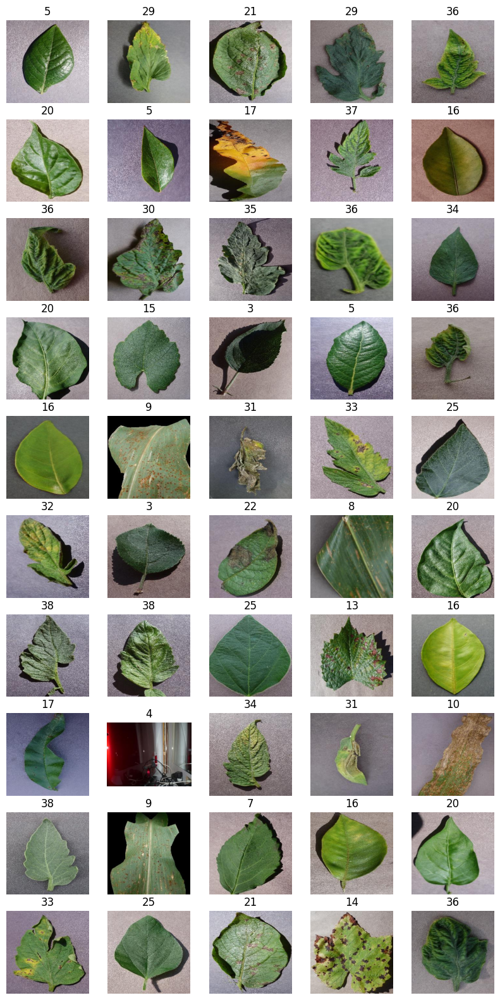

In [ ]:
#@title Charge Dataset
image_paths = []
labels = []

for label in os.listdir(dataset_path):
    subfolder_path = os.path.join(dataset_path, label)
    if os.path.isdir(subfolder_path):
        for img_name in os.listdir(subfolder_path):
            img_path = os.path.join(subfolder_path, img_name)
            image_paths.append(img_path)
            labels.append(label)

image_paths = np.array(image_paths)
labels = np.array(labels)

# Convertir etiquetas a índices
unique_labels = np.unique(labels)
label_to_index = {label: i for i, label in enumerate(unique_labels)}
indexed_labels = np.array([label_to_index[label] for label in labels])

# División 1: 70% entrenamiento y 30% restante
X_train, X_temp, Y_train_indexed, Y_temp_indexed = train_test_split(
    image_paths, indexed_labels, test_size=0.3, stratify=indexed_labels, random_state=42
)

# División 2: 30% restante en 10% validación y 20% prueba (=> 1:2 proporción)
X_val, X_test, Y_val_indexed, Y_test_indexed = train_test_split(
    X_temp, Y_temp_indexed, test_size=2/3, stratify=Y_temp_indexed, random_state=42
)

print(f"Número de clases: {len(unique_labels)}")
print(f"Entrenamiento: {len(X_train)}, Validación: {len(X_val)}, Prueba: {len(X_test)}")

# Mostrar ejemplos
plt.figure(figsize=(10, 20))
for i in range(50):
    ax = plt.subplot(10, 5, i + 1)
    plt.imshow(Image.open(X_train[i]))
    plt.title(Y_train_indexed[i])
    plt.axis("off")


In [ ]:
df_labels = pd.DataFrame({'label': labels})
label_counts = df_labels['label'].value_counts().rename('count')
labelsDict = pd.DataFrame.from_dict(label_to_index, orient='index', columns=['index'])
labelsDict = labelsDict.join(label_counts)
labelsDict.index.name = 'label'
labelsDict = labelsDict.sort_values(by='index')

labelsDict.head(100)

,index,count
label,,
Apple___Apple_scab,0,630
Apple___Black_rot,1,621
Apple___Cedar_apple_rust,2,275
Apple___healthy,3,1645
Background_without_leaves,4,1143
Blueberry___healthy,5,1502
Cherry___Powdery_mildew,6,1052
Cherry___healthy,7,854
Corn___Cercospora_leaf_spot Gray_leaf_spot,8,513


In [ ]:
#@title Data Pre-processing
def load_image(image_path, label_index):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (128, 128))
    img = img / 255.0
    return img, label_index

# Crear datasets sin cargar todo a memoria
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, Y_train_indexed))
train_dataset = train_dataset.map(load_image).batch(32).prefetch(tf.data.AUTOTUNE)

val_dataset = tf.data.Dataset.from_tensor_slices((X_val, Y_val_indexed))
val_dataset = val_dataset.map(load_image).batch(32).prefetch(tf.data.AUTOTUNE)

test_dataset = tf.data.Dataset.from_tensor_slices((X_test, Y_test_indexed))
test_dataset = test_dataset.map(load_image).batch(32).prefetch(tf.data.AUTOTUNE)

# Store the number of unique classes for the model's output layer
num_classes = len(unique_labels)

## **Vision Transformer Classifier (Dismissed)**

In [ ]:
class Patches(layers.Layer):
    def __init__(self, patch_size):
        super().__init__()
        self.patch_size = patch_size

    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding='VALID'
        )
        patch_dims = patches.shape[-1]
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])
        return patches

class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim):
        super().__init__()
        self.num_patches = num_patches
        self.projection = layers.Dense(units=projection_dim)
        self.position_embedding = layers.Embedding(input_dim=num_patches, output_dim=projection_dim)

    def call(self, patch):
        positions = tf.range(start=0, limit=self.num_patches, delta=1)
        encoded = self.projection(patch) + self.position_embedding(positions)
        return encoded

In [ ]:
def mlp(x, hidden_units, dropout_rate):
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x

def create_vit_classifier(input_shape=(128, 128, 3), patch_size=16, num_patches=64,
                          projection_dim=64, transformer_layers=8, num_heads=4,
                          transformer_units=[128, 64], mlp_head_units=[128], num_classes=39):

    inputs = layers.Input(shape=input_shape)

    # Crear los parches
    patches = Patches(patch_size)(inputs)
    encoded_patches = PatchEncoder(num_patches, projection_dim)(patches)

    # Bloques Transformer
    for _ in range(transformer_layers):
        # Normalización y atención
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
        attention_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=projection_dim)(x1, x1)
        x2 = layers.Add()([attention_output, encoded_patches])

        # Normalización y MLP
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        x3 = mlp(x3, hidden_units=transformer_units, dropout_rate=0.1)
        encoded_patches = layers.Add()([x3, x2])

    # Capa de clasificación
    representation = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
    representation = layers.Flatten()(representation)
    representation = layers.Dropout(0.5)(representation)
    features = mlp(representation, hidden_units=mlp_head_units, dropout_rate=0.5)
    out = layers.Dense(num_classes, activation="softmax")(features)  # multietiqueta = sigmoid

    model = keras.Model(inputs=inputs, outputs=out)
    return model

In [ ]:
model = create_vit_classifier(
    input_shape=(128, 128, 3),
    patch_size=16,
    num_patches=(128 // 16) ** 2,
    projection_dim=64,
    transformer_layers=4,
    num_heads=4,
    transformer_units=[128, 64],
    mlp_head_units=[128],
    num_classes=num_classes
)

model.compile(loss="sparse_categorical_crossentropy",optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),metrics=["accuracy"])

# model.summary()

history = model.fit(train_dataset, validation_data=test_dataset, epochs=50)

Epoch 1/50
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 74s 36ms/step - accuracy: 0.1253 - loss: 3.5096 - val_accuracy: 0.3909 - val_loss: 2.4139
Epoch 2/50
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 61s 30ms/step - accuracy: 0.3388 - loss: 2.5687 - val_accuracy: 0.5749 - val_loss: 1.6278
Epoch 3/50
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 78s 27ms/step - accuracy: 0.4748 - loss: 1.9482 - val_accuracy: 0.6855 - val_loss: 1.1479
Epoch 4/50
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - accuracy: 0.5710 - loss: 1.5487 - val_accuracy: 0.7575 - val_loss: 0.8441
Epoch 5/50
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 80s 29ms/step - accuracy: 0.6325 - loss: 1.2832 - val_accuracy: 0.7985 - val_loss: 0.7074
Epoch 6/50
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - accuracy: 0.6832 - loss: 1.0914 - val_accuracy: 0.8344 - val_loss: 0.5771
Epoch 7/50
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - accuracy: 0.7207 - loss: 0.9492 - val_accuracy: 0.8402 - val_loss: 0.5272
Epoch 8/50
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - accuracy: 0.7467 -

Text(0.5, 1.0, 'Training and Validation Loss')

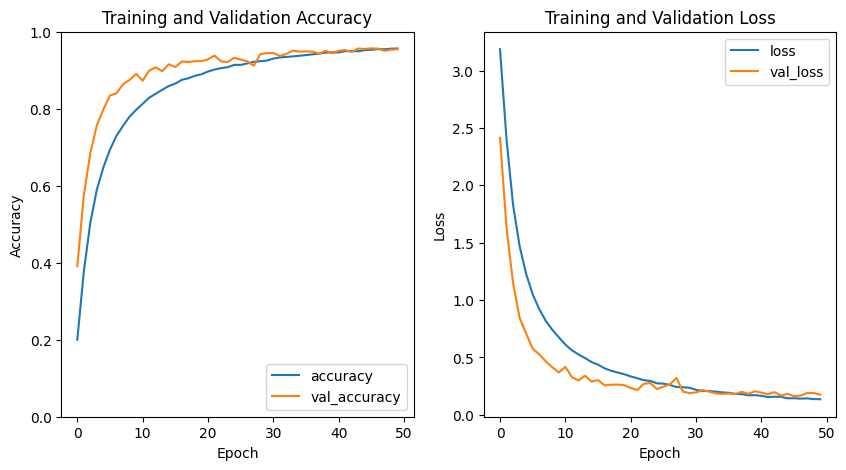

In [ ]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label = 'val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')


## **VGG-Net Classifier**

In [ ]:
base_vgg16 = VGG16(
    weights='imagenet',
    include_top=False,  # sin las capas densas finales
    input_shape=(128, 128, 3) # Changed input shape to match the dataset
)
base_vgg16.trainable = False
x = base_vgg16.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
output = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_vgg16.input, outputs=output)

model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
model.summary()

Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 128, 128, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 64, 64, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 16, 16, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_10     │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 39)             │        20,007 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 44,126,647 (168.33 MB)

 Trainable params: 14,695,975 (56.06 MB)

 Non-trainable params: 38,720 (151.25 KB)

 Optimizer params: 29,391,952 (112.12 MB)

In [ ]:
model.fit(train_dataset, validation_data=val_dataset, epochs=10)

Epoch 1/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 83s 68ms/step - accuracy: 0.4888 - loss: 2.0419 - val_accuracy: 0.5621 - val_loss: 1.8154
Epoch 2/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 142s 68ms/step - accuracy: 0.5469 - loss: 1.8105 - val_accuracy: 0.6177 - val_loss: 1.6278
Epoch 3/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 141s 68ms/step - accuracy: 0.5932 - loss: 1.6399 - val_accuracy: 0.6602 - val_loss: 1.4823
Epoch 4/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 142s 68ms/step - accuracy: 0.6302 - loss: 1.5062 - val_accuracy: 0.6880 - val_loss: 1.3663
Epoch 5/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 82s 68ms/step - accuracy: 0.6546 - loss: 1.3954 - val_accuracy: 0.7115 - val_loss: 1.2719
Epoch 6/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 142s 68ms/step - accuracy: 0.6772 - loss: 1.3107 - val_accuracy: 0.7266 - val_loss: 1.1938
Epoch 7/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 82s 68ms/step - accuracy: 0.6940 - loss: 1.2402 - val_accuracy: 0.7436 - val_loss: 1.1285
Epoch 8/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 143s 68ms/step - accuracy: 0.7

In [ ]:
# Descongelar todas excepto las primeras 4 capas
for i, layer in enumerate(base_vgg16.layers):
    if i < 4:
        layer.trainable = False
    else:
        layer.trainable = True

# Recompilar con un learning rate bajo
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
history = model.fit(train_dataset, validation_data=val_dataset, epochs=10)

Epoch 1/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 207s 171ms/step - accuracy: 0.8812 - loss: 0.3561 - val_accuracy: 0.9457 - val_loss: 0.1704
Epoch 2/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 239s 152ms/step - accuracy: 0.9468 - loss: 0.1548 - val_accuracy: 0.9647 - val_loss: 0.1015
Epoch 3/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 202s 152ms/step - accuracy: 0.9682 - loss: 0.0950 - val_accuracy: 0.9683 - val_loss: 0.1011
Epoch 4/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 202s 152ms/step - accuracy: 0.9777 - loss: 0.0653 - val_accuracy: 0.9739 - val_loss: 0.0810
Epoch 5/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 202s 152ms/step - accuracy: 0.9829 - loss: 0.0509 - val_accuracy: 0.9818 - val_loss: 0.0547
Epoch 6/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 202s 152ms/step - accuracy: 0.9881 - loss: 0.0360 - val_accuracy: 0.9798 - val_loss: 0.0616
Epoch 7/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 185s 152ms/step - accuracy: 0.9905 - loss: 0.0303 - val_accuracy: 0.9818 - val_loss: 0.0531
Epoch 8/10
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 202s 152ms/step - ac

In [ ]:
model.save('/content/drive/MyDrive/AI-2/Proyecto/mi_modelo_vgg.h5')

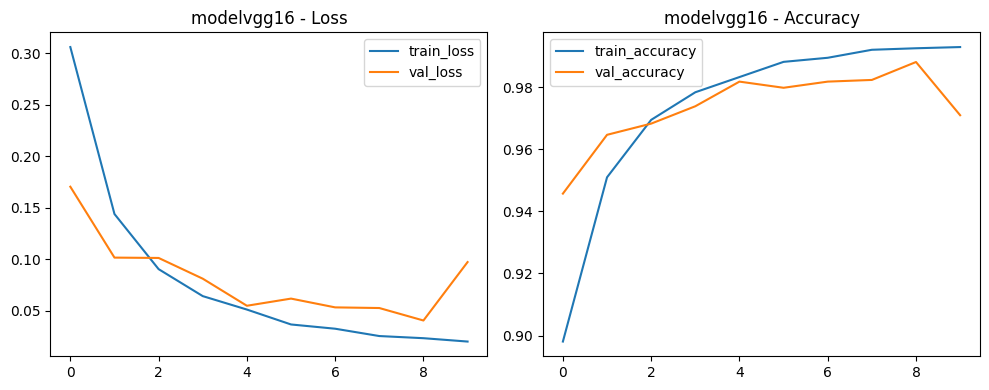

In [ ]:
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.title('modelvgg16 - Loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='train_accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.title('modelvgg16 - Accuracy')
plt.legend()
plt.tight_layout()
plt.show()

#### **Test**

In [ ]:
# Obtener las predicciones del modelo en el conjunto de prueba
# predict devuelve las probabilidades para cada clase
predictions = model.predict(test_dataset)

# Convertir las probabilidades a clases predichas
# argmax devuelve el índice de la probabilidad más alta para cada muestra
predicted_classes = np.argmax(predictions, axis=1)

# Obtener las etiquetas verdaderas del conjunto de prueba
# Como test_dataset es un tf.data.Dataset, necesitamos iterar sobre él para obtener las etiquetas
true_classes = []
for images, labels in test_dataset:
    true_classes.extend(labels.numpy())
true_classes = np.array(true_classes)


# Calcular métricas usando sklearn
# Accuracy global
sklearn_accuracy = accuracy_score(true_classes, predicted_classes)
print(f"Sklearn Accuracy: {sklearn_accuracy:.4f}")

# Precision, Recall y F1-Score (ejemplo con average='macro')
# 'macro' calcula métricas para cada etiqueta y encuentra su promedio no ponderado.
# No tiene en cuenta el desequilibrio de etiquetas.
sklearn_precision_macro = precision_score(true_classes, predicted_classes, average='macro')
sklearn_recall_macro = recall_score(true_classes, predicted_classes, average='macro')
sklearn_f1_macro = f1_score(true_classes, predicted_classes, average='macro')

print(f"Sklearn Macro Precision: {sklearn_precision_macro:.4f}")
print(f"Sklearn Macro Recall: {sklearn_recall_macro:.4f}")
print(f"Sklearn Macro F1-score: {sklearn_f1_macro:.4f}")

# Precision, Recall y F1-Score (ejemplo con average='weighted')
# 'weighted' calcula métricas para cada etiqueta y encuentra su promedio ponderado por
# el número de muestras verdaderas para cada etiqueta. Es útil para conjuntos de datos desequilibrados.
sklearn_precision_weighted = precision_score(true_classes, predicted_classes, average='weighted')
sklearn_recall_weighted = recall_score(true_classes, predicted_classes, average='weighted')
sklearn_f1_weighted = f1_score(true_classes, predicted_classes, average='weighted')

print(f"Sklearn Weighted Precision: {sklearn_precision_weighted:.4f}")
print(f"Sklearn Weighted Recall: {sklearn_recall_weighted:.4f}")
print(f"Sklearn Weighted F1-score: {sklearn_f1_weighted:.4f}")


347/347 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step
Sklearn Accuracy: 0.9689
Sklearn Macro Precision: 0.9669
Sklearn Macro Recall: 0.9562
Sklearn Macro F1-score: 0.9578
Sklearn Weighted Precision: 0.9735
Sklearn Weighted Recall: 0.9689
Sklearn Weighted F1-score: 0.9683


## **EfficientNet Classifier (Dismissed)**

In [ ]:
base_model_EN = EfficientNetB0(
    include_top=False,
    weights='imagenet',
    input_shape=(128, 128, 3)
)

base_model_EN.trainable = False

x = base_model_EN.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
output = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model_EN.input, outputs=output)

model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
model.summary()

Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_27      │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_38        │ (None, 128, 128,  │          0 │ input_layer_27[0… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_19    │ (None, 128, 128,  │          7 │ rescaling_38[0][… │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_39        │ (None, 128, 128,  │          0 │ normalization_19… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 129, 129,  │          0 │ rescaling_39[0][… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 64, 64,    │      1,296 │ stem_conv_pad[0]… │
│                     │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 64, 64,    │        192 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 64, 64,    │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 64, 64,    │        432 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 64, 64,    │        192 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 64, 64,    │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 48)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 48)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 12)  │        588 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 48)  │        624 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 64, 64,    │          0 │ block1a_activati… │
│ (Multiply)          │ 48)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 64, 64,    │      1,152 │ block1a_se_excit

 Total params: 28,593,438 (109.08 MB)

 Trainable params: 79,911 (312.15 KB)

 Non-trainable params: 28,513,527 (108.77 MB)

In [ ]:
model.fit(train_dataset, validation_data=test_dataset, epochs=20)

Epoch 1/20
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 194s 101ms/step - accuracy: 0.0931 - loss: 3.4904 - val_accuracy: 0.1343 - val_loss: 3.3404
Epoch 2/20
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 123s 65ms/step - accuracy: 0.1073 - loss: 3.4276 - val_accuracy: 0.1342 - val_loss: 3.3148
Epoch 3/20
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 93s 67ms/step - accuracy: 0.1136 - loss: 3.3999 - val_accuracy: 0.1340 - val_loss: 3.2948
Epoch 4/20
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 91s 65ms/step - accuracy: 0.1163 - loss: 3.3831 - val_accuracy: 0.1327 - val_loss: 3.2823
Epoch 5/20
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 142s 66ms/step - accuracy: 0.1167 - loss: 3.3757 - val_accuracy: 0.1341 - val_loss: 3.2732
Epoch 6/20
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 143s 67ms/step - accuracy: 0.1178 - loss: 3.3643 - val_accuracy: 0.1335 - val_loss: 3.2667
Epoch 7/20


## **ResNet Classifier (Dismissed)**

In [ ]:
# Cargar modelo preentrenado
base_model = ResNet50(weights="imagenet", include_top=False, input_shape=(128, 128, 3))
base_model.trainable = True  # Congelar capas preentrenadas

# Construir modelo sobre ResNet
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),  # Reducir dimensiones
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.5),
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.5),
    layers.Dense(num_classes, activation="softmax")  # Número de clases
])

# Compilar el modelo
model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

In [ ]:
history=model.fit(train_dataset, validation_data=test_dataset, epochs=15)

Epoch 1/15
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 315s 151ms/step - accuracy: 0.6763 - loss: 1.2709 - val_accuracy: 0.6923 - val_loss: 1.1301
Epoch 2/15
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 217s 133ms/step - accuracy: 0.9219 - loss: 0.2684 - val_accuracy: 0.8343 - val_loss: 0.5860
Epoch 3/15
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 201s 132ms/step - accuracy: 0.9507 - loss: 0.1640 - val_accuracy: 0.7956 - val_loss: 0.8212
Epoch 4/15
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 202s 132ms/step - accuracy: 0.9550 - loss: 0.1460 - val_accuracy: 0.9154 - val_loss: 0.3093
Epoch 5/15
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 186s 134ms/step - accuracy: 0.9684 - loss: 0.1069 - val_accuracy: 0.8950 - val_loss: 0.3997
Epoch 6/15
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 205s 136ms/step - accuracy: 0.9711 - loss: 0.0958 - val_accuracy: 0.8333 - val_loss: 0.8039
Epoch 7/15
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 197s 142ms/step - accuracy: 0.9763 - loss: 0.0792 - val_accuracy: 0.8716 - val_loss: 0.5839
Epoch 8/15
1387/1387 ━━━━━━━━━━━━━━━━━━━━ 192s 135ms/step - ac

Text(0.5, 1.0, 'Training and Validation Loss')

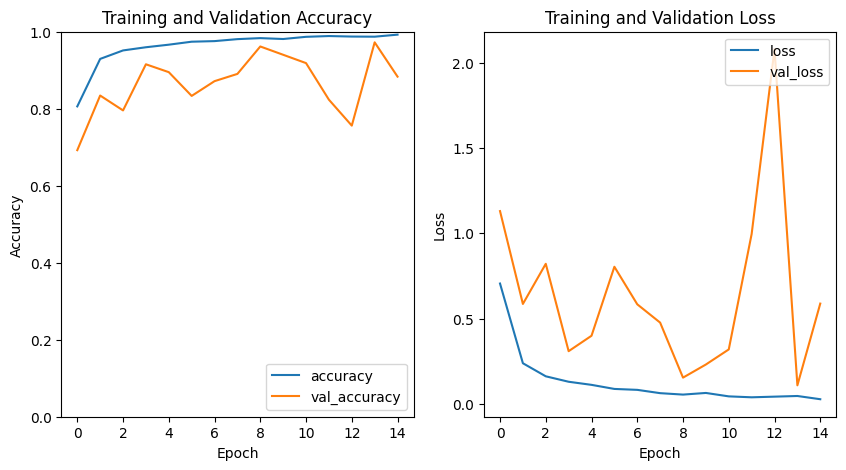

In [ ]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label = 'val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')



# **Verficaciones adicionales**

In [ ]:
def cargar_imagenes_desde_drive(ruta_carpeta):
    imagenes_tensor = []
    nombres_archivos = []

    for nombre_archivo in sorted(os.listdir(ruta_carpeta)):
        if nombre_archivo.lower().endswith(('.jpg', '.jpeg', '.png')):
            ruta_img = os.path.join(ruta_carpeta, nombre_archivo)


            img = tf.io.read_file(ruta_img)
            img = tf.image.decode_jpeg(img, channels=3)
            img = tf.image.resize(img, (128, 128))
            img = img / 255.0

            imagenes_tensor.append(img)
            nombres_archivos.append(nombre_archivo)

    batch = tf.stack(imagenes_tensor)
    return batch, nombres_archivos
def aplicar_gradcam(modelo, imagen, clase_predicha, nombre_capa='block5_conv3'):
    # Crear un modelo que devuelva la activación y salida
    grad_model = tf.keras.models.Model(
        [modelo.inputs],
        [modelo.get_layer(nombre_capa).output, modelo.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(tf.expand_dims(imagen, axis=0))
        loss = predictions[:, clase_predicha]

    # Gradiente respecto a la activación
    grads = tape.gradient(loss, conv_outputs)[0]

    # Promediar por canal
    weights = tf.reduce_mean(grads, axis=(0, 1))

    # Ponderar la activación
    cam = tf.reduce_sum(tf.multiply(weights, conv_outputs[0]), axis=-1)

    # ReLU y normalización
    cam = tf.maximum(cam, 0)
    cam = cam / tf.math.reduce_max(cam)
    cam = tf.image.resize(cam[..., tf.newaxis], (128, 128))
    cam = tf.squeeze(cam)

    return cam.numpy()


def mostrar_imagen_con_gradcam(imagen, gradcam_map, nombre, clase_predicha):
    plt.figure(figsize=(4, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(imagen)
    plt.imshow(gradcam_map, cmap='jet', alpha=0.4)  # superponer
    plt.title(f"{nombre}\nPredicción: {clase_predicha}")
    plt.axis('off')
    plt.tight_layout()
    plt.subplot(1, 2, 2)
    plt.imshow(imagen)
    plt.title("Imagen original")
    plt.axis('off')
    plt.show()

In [ ]:
ruta = '/content/drive/MyDrive/AI-2/Proyecto/Imagenes_Test'
batch_imagenes, nombres = cargar_imagenes_desde_drive(ruta)

In [ ]:
predicciones = model.predict(batch_imagenes)

clases_predichas = tf.argmax(predicciones, axis=1).numpy()

print("Clases predichas:", clases_predichas)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
Clases predichas: [ 6 17 13 12 12 15 11 31 19  4  5 19 20 14  5 25  4 31 33 27  8 16 30 30
 33 36 26  8  9  8]


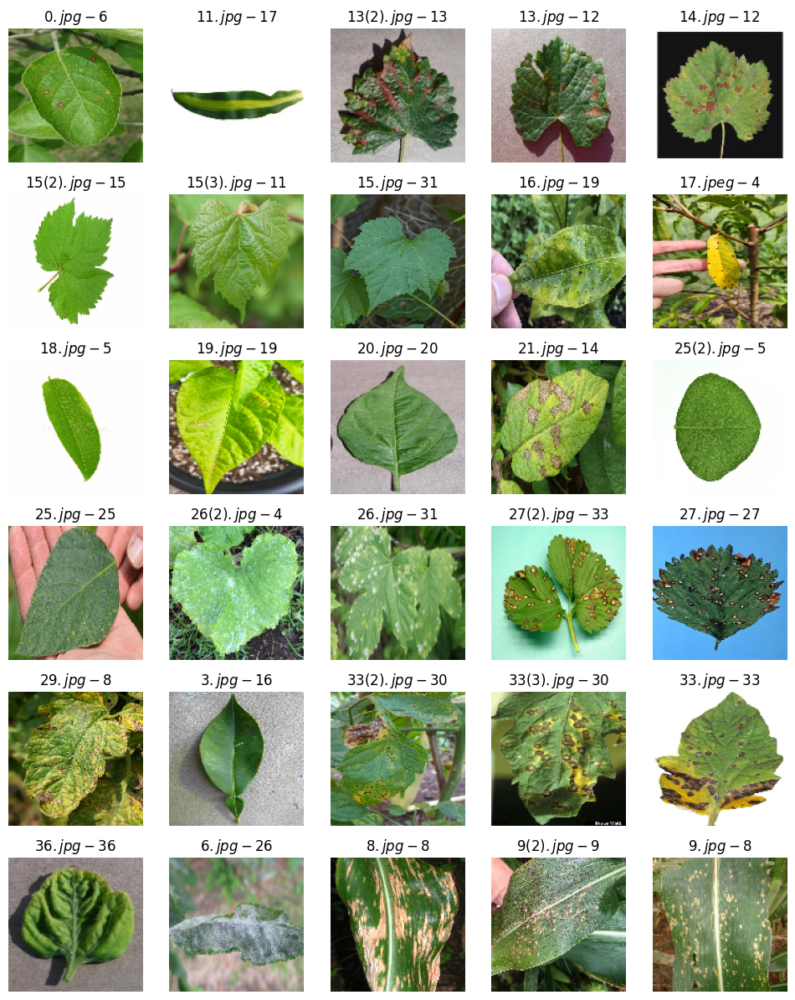

In [ ]:

plt.figure(figsize=(12, 15))
for i in range(30):
    ax = plt.subplot(6, 5, i + 1)
    plt.imshow(batch_imagenes[i])
    plt.title(f"${nombres[i]}-${clases_predichas[i]}")
    plt.axis("off")


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_220']]
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


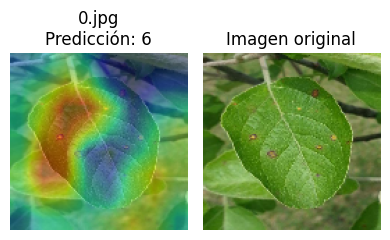

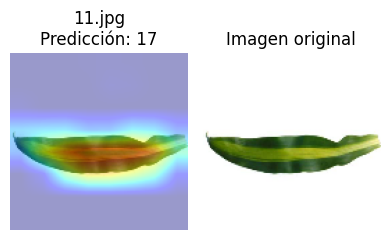

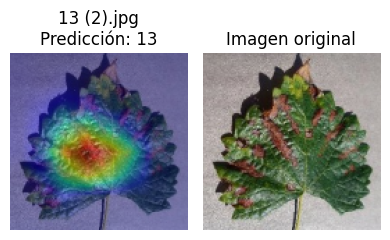

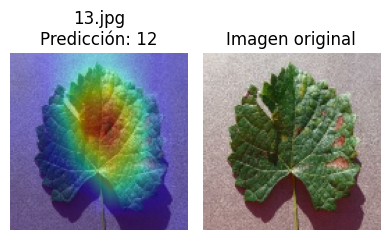

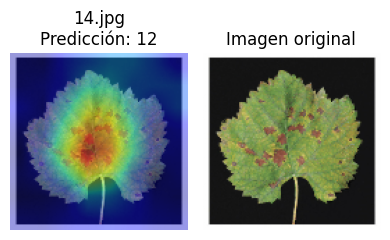

...

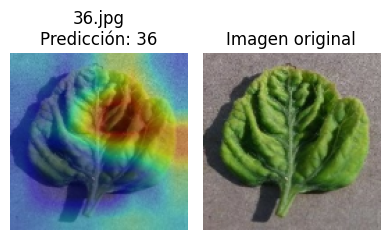

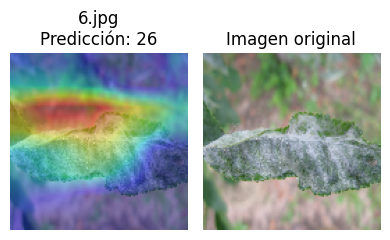

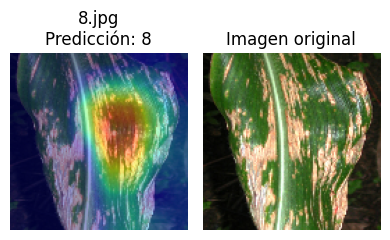

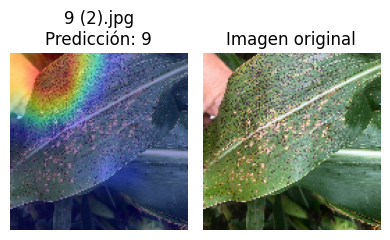

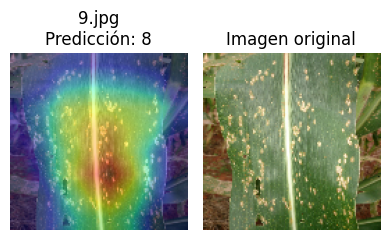

In [ ]:
for i in range(30):
    img = batch_imagenes[i]
    nombre = nombres[i]
    clase = clases_predichas[i]

    gradcam = aplicar_gradcam(model, img, clase)
    mostrar_imagen_con_gradcam(img.numpy(), gradcam, nombre, clase)